Author: Luca Pappalardo
</br>Geospatial Analytics, Master degree in Data Science and Business Informatics, University of Pisa

# Geospatial Analytics - Lesson 3: Spatial and Mobility data

In this lesson, we will learn how to handle and explore spatial data in Python using folium and scikit-mobility.

1. [Exploring datasets](#exploring)
    - [GPS traces](#gpstraces)
    - [Geotagged posts](#geotaggedposts)
    - [Skmob data module](#datamodule)
    - [Practice](#practice1)
2. [Road Networks and OSMnx](#roadnetworks)
    - [Get administrative boundaries](#getboundaries)
    - [Download road networks](#downloadnetworks)
    - [Analyze road networks](#analyzenetworks)
3. [Points of Interest and Geospatial entities](#pois)

<a id="exploring"></a>
# Exploring datasets in scikit-mobility

One of the use cases for [scikit-mobility](https://github.com/scikit-mobility/scikit-mobility) is the exploratory data analysis of mobility datasets, which includes the visualization of trajectories and flows. 

To this end, both `TrajDataFrame` and `FlowDataFrame` have methods that allow the user to produce interactive visualizations generated using [folium](https://python-visualization.github.io/folium/). 

## Visualizing trajectories

A `TrajDataFrame` has three main plotting methods: 
- `plot_trajectory` plots a line connecting the trajectory points on a map;
- `plot_stops` plots the location of stops on a map; 
- `plot_diary` plots the sequence of visited locations over time.

### Plot trajectories

Method `plot_trajectory` plots the time-ordered trajectory points connected by straight lines on a map. 

If the column `uid`is present and contains more than one object, the trajectory points are first grouped by `uid` and then sorted by `datetime`.

Large `TrajDataFrame`s with many points can be computationally intensive to visualize. Two arguments can be used to reduce the amount of data to plot:
- `max_users` limits the number of objects whose trajectories should be plotted
- `max_points` limits the number of trajectory points per object to plot, i.e., if necessary an object's trajectory will be down-sampled and at most `max_points` points will be plotted.

The plot style can be customized via arguments to specify the color, weight, and opacity of the trajectory lines, as well as the type of map tiles to use. 
The user can also plot markers denoting the start points and the end points of the trajectory. 

The `plot_trajectory` method, as well as all the other plotting methods, return a `folium.Map` object, which can be used by other `folium` and scikit-mobility functions to visualize additional data on the same map. A `folium.Map` object can be passed to a plotting method via the argument `map_f`. If `map_f` is `None`, the trajectories are plotted on a new map.


In [1]:
# import the library
import skmob
import pandas as pd
import folium
from folium.plugins import HeatMap

In [2]:
skmob.__version__

'1.3.1'

In [8]:
# From a list
data_list = [[1, 39.984044, 116.319236, '2008-10-23 13:53:05'],
             [1, 39.984198, 116.319322, '2008-10-23 13:53:06'],
             [1, 39.974224, 116.319402, '2008-10-23 13:53:11'],
             [1, 39.974211, 116.219389, '2008-10-23 13:53:16']]

In [9]:
tdf = skmob.TrajDataFrame(data_list, user_id=0, latitude=1, longitude=2, datetime=3)
tdf

,uid,lat,lng,datetime
0,1,39.984044,116.319236,2008-10-23 13:53:05
1,1,39.984198,116.319322,2008-10-23 13:53:06
2,1,39.974224,116.319402,2008-10-23 13:53:11
3,1,39.974211,116.219389,2008-10-23 13:53:16


In [10]:
map_f = tdf.plot_trajectory(zoom=12, start_end_markers=False, hex_color='red')
map_f

C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: Only the trajectories of the first 10 users will be plotted. Use the argument `max_users` to specify the desired number of users, or filter the TrajDataFrame.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,
C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


<a id='gpstraces'></a>
## GPS traces

The [Geolife dataset](https://www.microsoft.com/en-us/download/details.aspx?id=52367&from=https%3A%2F%2Fresearch.microsoft.com%2Fen-us%2Fdownloads%2Fb16d359d-d164-469e-9fd4-daa38f2b2e13%2F) is a GPS trajectory dataset collected by Microsoft Research Asia. The dataset describes 182 users in a period of over three years (from April 2007 to August 2012).

In [11]:
# create a TrajDataFrame from a dataset of GPS traces
url = "https://github.com/scikit-mobility/tutorials/raw/master/mda_masterbd2020/data/geolife_sample.txt.gz"
tdf = skmob.TrajDataFrame.from_file(url)
print(type(tdf))
tdf.head()

<class 'skmob.core.trajectorydataframe.TrajDataFrame'>


,lat,lng,datetime,uid
0,39.984094,116.319236,2008-10-23 05:53:05,1
1,39.984198,116.319322,2008-10-23 05:53:06,1
2,39.984224,116.319402,2008-10-23 05:53:11,1
3,39.984211,116.319389,2008-10-23 05:53:16,1
4,39.984217,116.319422,2008-10-23 05:53:21,1


In [12]:
tdf.uid.unique()

array([1, 5], dtype=int64)

In [13]:
map_f = tdf.plot_trajectory(zoom=12, max_users=2) #hex_color='#000000')
map_f

C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


NOTE: if trajectories represent abstract mobility, such as movements extracted from social media posts or mobile phone records, straight lines may appear that do not consider walls, buildings, and similar structures on the road network. 

## Geotagged traces

Brightkite was once a location-based social networking service provider where users shared their locations by checking-in. The [available dataset](https://snap.stanford.edu/data/loc-brightkite.html) describes friendship network was collected using their public API, and consists of $58,228$ nodes and $214,078$ edges. The network is originally directed but we have constructed a network with undirected edges when there is a friendship in both ways. The dataset also contains a total of $4,491,143$ checkins of these users over the period of Apr. 2008 - Oct. 2010.

In [14]:
url = 'https://snap.stanford.edu/data/loc-brightkite_totalCheckins.txt.gz'
df = pd.read_csv(url, sep = '\t', header = 0, nrows = 100000, 
                 names = ['user', 'check-in_time', 'latitude', 'longitude', 'location id'])
tdf_ci = skmob.TrajDataFrame(df, latitude = 'latitude', longitude = 'longitude', 
                          datetime = 'check-in_time', user_id = 'user').sort_values(by = 'datetime')

In [15]:
tdf_ci.head()

,uid,datetime,lat,lng,location id
15410,12,2008-03-22 05:01:29+00:00,39.768753,-105.006395,7b52009b64fd0a2a49e6d8a939753077792b0554
15409,12,2008-03-22 05:50:55+00:00,39.768057,-105.002983,fa35e192121eabf3dabf9f5ea6abdbcbc107ac3b
15408,12,2008-03-22 06:17:35+00:00,39.768057,-105.002983,fa35e192121eabf3dabf9f5ea6abdbcbc107ac3b
15407,12,2008-03-22 06:34:37+00:00,39.768057,-105.002983,fa35e192121eabf3dabf9f5ea6abdbcbc107ac3b
15406,12,2008-03-22 19:45:30+00:00,39.785486,-104.895457,f1abd670358e036c31296e66b3b66c382ac00812


In [16]:
map_f = tdf_ci.plot_trajectory(max_users=2, start_end_markers=False, zoom=3)
folium.Marker([0.0, 0.0], popup="Null Island", tooltip="Null Island").add_to(map_f)
map_f

C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


In [17]:
ni_tdf_ci = tdf_ci[(tdf_ci['lat'] == 0.0) & (tdf_ci['lng'] == 0.0)]
print(len(ni_tdf_ci))
ni_tdf_ci

975


,uid,datetime,lat,lng,location id
49976,47,2008-10-16 16:57:22+00:00,0.0,0.0,8758bc71b1094b2ddf2d41649767aa54778a6a11
49975,47,2008-10-16 17:50:56+00:00,0.0,0.0,8758bc71b1094b2ddf2d41649767aa54778a6a11
49974,47,2008-10-16 17:51:07+00:00,0.0,0.0,8758bc71b1094b2ddf2d41649767aa54778a6a11
49973,47,2008-10-16 17:51:24+00:00,0.0,0.0,8758bc71b1094b2ddf2d41649767aa54778a6a11
34694,30,2009-10-06 07:17:50+00:00,0.0,0.0,00000000000000000000000000000000
...,...,...,...,...,...
82105,146,2010-10-15 20:26:30+00:00,0.0,0.0,00000000000000000000000000000000
82104,146,2010-10-15 21:05:04+00:00,0.0,0.0,00000000000000000000000000000000
82103,146,2010-10-15 23:43:03+00:00,0.0,0.0,00000000000000000000000000000000
82099,146,2010-10-16 23:59:24+00:00,0.0,0.0,00000000000000000000000000000000


In [18]:
map_f = folium.Map(location=[0.0, 0.0], zoom_start = 5) 
heat_data = [[row['lat'],row['lng']] for index, row in tdf_ci.iterrows()]
HeatMap(heat_data).add_to(map_f)
folium.Marker([0.0, 0.0], popup="Null Island", tooltip="Null Island").add_to(map_f)
map_f

## Visualizing flows

A `FlowDataFrame` has two main plotting methods:
- `plot_tessellation` plots the tessellation's tiles on a geographic map;
- `plot_flows` plots, on a geographic map, the lines connecting the centroids of the tessellation's tiles between which flows are present.

### Plot tessellation

Method `plot_tessellation` plots the `GeoDataFrame` associated with a `FlowDataFrame` on a geographic map. 

Large tessellations with many tiles can be computationally intensive to visualize. The argument `maxitems` can be used to limit the number of tiles to plot (default: -1, which means that all tiles are displayed).

The plot style can be customized via arguments to specify the color, opacity of the tiles, and the type of map tiles to use. The argument `popup_features` allows to enhance the plot's interactivity displaying popup windows that appear when the user clicks on a tile and includes information contained in the columns of the tessellation's `GeoDataFrame` specified in the argument's list.

In [19]:
import geopandas as gpd
from skmob import FlowDataFrame

In [20]:
url = "https://raw.githubusercontent.com/scikit-mobility/tutorials/master/mda_masterbd2020/data/NY_counties_2011.geojson"
tessellation = gpd.read_file(
    url) # load a tessellation
tessellation.head()

,tile_id,population,geometry
0,36019,81716,"POLYGON ((-74.00667 44.88602, -74.02739 44.995..."
1,36101,99145,"POLYGON ((-77.09975 42.27421, -77.09966 42.272..."
2,36107,50872,"POLYGON ((-76.25015 42.29668, -76.24914 42.302..."
3,36059,1346176,"POLYGON ((-73.70766 40.72783, -73.70027 40.739..."
4,36011,79693,"POLYGON ((-76.27907 42.78587, -76.27535 42.780..."


In [21]:
from skmob.utils.plot import plot_gdf

In [22]:
plot_gdf(tessellation)

In [23]:
url = "https://github.com/scikit-mobility/tutorials/raw/master/mda_masterbd2020/data/NY_commuting_flows_2011.csv"
# create a FlowDataFrame from a file and a tessellation
fdf = skmob.FlowDataFrame.from_file(url, tessellation=tessellation, tile_id='tile_id')
fdf.head()

,flow,origin,destination
0,121606,36001,36001
1,5,36001,36005
2,29,36001,36007
3,11,36001,36017
4,30,36001,36019


In [24]:
fdf.plot_tessellation(popup_features=['tile_id','population'], style_func_args={'fillColor':'black', 'color':'red'})

### Plot flows

Method `plot_flows` plots the flows on a geographic map as lines between the centroids of the tiles in the `FlowDataFrame`'s tessellation. 

Large `FlowDataFrame`s with many origin-destination pairs can be computationally intensive to visualize. The argument `min_flow` can be used to specify that only flows larger than `min_flow` should be displayed. 

The thickness of each line is a function of the flow and can be specified via the arguments `flow_weight`, `flow_exp` and `style_function`. 

The plot style can be further customized via arguments to specify the color, opacity of the flow lines, and the type of map tiles to use. 

The arguments `flow_popup` and `tile_popup` allow enhancing the plot's interactivity displaying popup windows that appear when the user clicks on a flow line or a circle in an origin location, respectively, and include information on the flow or the flows from a location.

In [25]:
fdf.plot_flows(min_flow=100)

The user can also visualize the tessellation and the flows in the same plot.

In [26]:
map_f = fdf.plot_tessellation(style_func_args={'fillColor':'blue', 'color':'blue'}) 
fdf.plot_flows(map_f=map_f, min_flow=50)#, flow_exp=0.5)

<a id="datamodule"></a>
## The scikit-mobility data module

The scikit-mobility data module allows you to retrieve mobility datasets via an easy-to-use interface. Look at the documentation [here](https://scikit-mobility.github.io/scikit-mobility/reference/data.html).

The data module API consists of two main functions: `list_datasets` and `load_dataset`. 
- `list_datasets` shows the datasets already available in the repository;
- `load_dataset `retrieves the requested dataset and directly outputs it into a skmob-friendly data structure.

___

The scikit-mobility data types and format to describe mobility data are the following:

- trajectory $\rightarrow$ `TrajDataFrame`
- flow $\rightarrow$ `FlowDataFrame`
- shape $\rightarrow$ `GeoDataFrame`
- auxiliar $\rightarrow$ `DataFrame`

In [3]:
from skmob.data.load import load_dataset, list_datasets

### `list_datasets()`

`list_datasets` shows the names and information of the datasets already available in the scikit-mobility repository;

In [33]:
# list all the datasets' names without details

print(list_datasets())

['flow_foursquare_nyc', 'foursquare_nyc', 'nyc_boundaries', 'parking_san_francisco', 'taxi_san_francisco']


In [34]:
# list all the datasets with details into a Pandas DataFrame
dataset_details = list_datasets(details=True)
pd.DataFrame.from_dict(dataset_details, orient='index')

,name,description,url,hash,data_type,auth,download_format,sep,encoding
flow_foursquare_nyc,Flow_nyc,FlowDataFrame describing the movements of indi...,http://www-public.it-sudparis.eu/~zhang_da/pub...,,flow,no,zip,\t,ISO-8859-1
foursquare_nyc,Foursquare_NYC,Dataset containing the Foursquare checkins of ...,http://www-public.it-sudparis.eu/~zhang_da/pub...,cbe3fdab373d24b09b5fc53509c8958c77ff72b6c1a685...,trajectory,no,zip,\t,ISO-8859-1
nyc_boundaries,NewYorkCity_boundaries,This Shapefile containts the Borough Boundarie...,https://www1.nyc.gov/assets/planning/download/...,,shape,no,zip,,ISO-8859-1
parking_san_francisco,ParkingMeteres_SanFrancisco,Parking meters in San Francisco.,https://data.sfgov.org/api/views/8vzz-qzz9/row...,,auxiliar,no,,",",ISO-8859-1
taxi_san_francisco,Taxi_SanFrancisco,This traceset contains mobility traces of taxi...,https://crawdad.org//download/epfl/mobility/ca...,,trajectory,yes,tar,,ISO-8859-1


In [35]:
# list all the datasets of type "flow" with details into a Pandas DataFrame
dataset_details = list_datasets(data_types='flow', details=True)
pd.DataFrame.from_dict(dataset_details, orient='index')

,name,description,url,hash,data_type,auth,download_format,sep,encoding
flow_foursquare_nyc,Flow_nyc,FlowDataFrame describing the movements of indi...,http://www-public.it-sudparis.eu/~zhang_da/pub...,,flow,no,zip,\t,ISO-8859-1


In [36]:
#list all the datasets of type "trajectory" or "shape" with details into a Pandas DataFrame
dataset_details = list_datasets(data_types=['trajectory', 'shape'], details=True)
pd.DataFrame.from_dict(dataset_details, orient='index')

,name,description,url,hash,auth,data_type,download_format,sep,encoding
foursquare_nyc,Foursquare_NYC,Dataset containing the Foursquare checkins of ...,http://www-public.it-sudparis.eu/~zhang_da/pub...,cbe3fdab373d24b09b5fc53509c8958c77ff72b6c1a685...,no,trajectory,zip,\t,ISO-8859-1
nyc_boundaries,NewYorkCity_boundaries,This Shapefile containts the Borough Boundarie...,https://www1.nyc.gov/assets/planning/download/...,,no,shape,zip,,ISO-8859-1
taxi_san_francisco,Taxi_SanFrancisco,This traceset contains mobility traces of taxi...,https://crawdad.org//download/epfl/mobility/ca...,,yes,trajectory,tar,,ISO-8859-1


### `load_dataset()`

`load_dataset` retrieves the requested dataset and directly outputs it into a skmob-friendly data structure.

#### Load the Foursquare NYC trajectory dataset

In [37]:
# loading the trajectory dataset into a TrajDataFrame
tdf_nyc = load_dataset("foursquare_nyc", drop_columns=True)
print(type(tdf_nyc))

Unzipping contents of 'C:\Users\Pavilion\AppData\Local\skmob_data\skmob_data\Cache\55d9132fcc6ebd6a1269944a3b851bb0-dataset_tsmc2014.zip' to 'C:\Users\Pavilion\AppData\Local\skmob_data\skmob_data\Cache\55d9132fcc6ebd6a1269944a3b851bb0-dataset_tsmc2014.zip.unzip'


<class 'skmob.core.trajectorydataframe.TrajDataFrame'>


C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\data\load.py:147: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  dataset._info = dataset_info


In [38]:
print(tdf_nyc._info)

{'name': 'Foursquare_NYC', 'description': 'Dataset containing the Foursquare checkins of individuals moving in New York City', 'url': 'http://www-public.it-sudparis.eu/~zhang_da/pub/dataset_tsmc2014.zip', 'hash': 'cbe3fdab373d24b09b5fc53509c8958c77ff72b6c1a68589ce337d4f9a80235b', 'auth': 'no', 'data_type': 'trajectory', 'download_format': 'zip', 'sep': '\t', 'encoding': 'ISO-8859-1'}


In [39]:
type(tdf_nyc)

skmob.core.trajectorydataframe.TrajDataFrame

In [40]:
tdf_nyc.head()

,uid,lat,lng,datetime
0,470,40.719810,-74.002581,2012-04-03 18:00:09+00:00
1,979,40.606800,-74.044170,2012-04-03 18:00:25+00:00
2,69,40.716162,-73.883070,2012-04-03 18:02:24+00:00
3,395,40.745164,-73.982519,2012-04-03 18:02:41+00:00
4,87,40.740104,-73.989658,2012-04-03 18:03:00+00:00


#### Load the Shape of New York City's boundaries

In [41]:
# loading the shape into a GeoDataFrame
shape_nyc = load_dataset("nyc_boundaries")
print(type(shape_nyc))

SHA256 hash of downloaded file: 0658159f371b2e5b34404881c6524d3a427c3cb84955a8a1472bd646af4d44b4
Use this value as the 'known_hash' argument of 'pooch.retrieve' to ensure that the file hasn't changed if it is downloaded again in the future.
Unzipping contents of 'C:\Users\Pavilion\AppData\Local\skmob_data\skmob_data\Cache\1e711308a23cfba405f2e8858c7ffed0-nybbwi_22a.zip' to 'C:\Users\Pavilion\AppData\Local\skmob_data\skmob_data\Cache\1e711308a23cfba405f2e8858c7ffed0-nybbwi_22a.zip.unzip'


<class 'geopandas.geodataframe.GeoDataFrame'>


C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\geopandas\geodataframe.py:182: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  super(GeoDataFrame, self).__setattr__(attr, val)


In [42]:
print(shape_nyc._info)

{'name': 'NewYorkCity_boundaries', 'description': 'This Shapefile containts the Borough Boundaries of NYC (Water Areas Included)', 'url': 'https://www1.nyc.gov/assets/planning/download/zip/data-maps/open-data/nybbwi_22a.zip', 'hash': '', 'data_type': 'shape', 'auth': 'no', 'download_format': 'zip', 'sep': ' ', 'encoding': 'ISO-8859-1'}


In [43]:
shape_nyc = shape_nyc.to_crs("epsg:4326")
shape_nyc.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,4,Queens,459288.088863,4.962978e+09,"POLYGON ((-73.77896 40.81171, -73.76371 40.793..."
1,3,Brooklyn,236463.384375,2.697625e+09,"POLYGON ((-73.92722 40.72533, -73.92654 40.724..."
2,5,Staten Island,220559.462653,2.851606e+09,"POLYGON ((-74.05581 40.64971, -74.05619 40.639..."
3,1,Manhattan,203743.107953,9.443058e+08,"MULTIPOLYGON (((-74.04388 40.69019, -74.04351 ..."
4,2,Bronx,188171.236461,1.598383e+09,"POLYGON ((-73.86477 40.90201, -73.86305 40.901..."


#### Let's use the loaded datasets!

In [44]:
# plot the trajectories of the first 3 users over the shapefile of New York City

from skmob.utils.plot import plot_gdf

map_f = tdf_nyc.plot_trajectory(max_users=3)
map_f = plot_gdf(shape_nyc, zoom=10, map_f=map_f)

map_f

C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


<a id="practice1"></a>
## Practice
Download and explore the [Gowalla checkins dataset](https://snap.stanford.edu/data/loc-gowalla.html).

Gowalla was a location-based social networking website where users share their locations by checking-in. The dataset contains a friendship network (undirected) collected using their public API, and consists of $196,591$ nodes and $950,327$ edges. The dataset also contains a total of $6,442,890$ check-ins of these users over the period of Feb. 2009 - Oct. 2010.

In [45]:
url = 'https://snap.stanford.edu/data/loc-gowalla_totalCheckins.txt.gz'
df = pd.read_csv(url, sep = '\t', header = 0, nrows = 100000, 
                 names = ['user', 'check-in_time', 'latitude', 'longitude', 'location id'])
tdf_gow = skmob.TrajDataFrame(df, latitude = 'latitude', longitude = 'longitude', 
                          datetime = 'check-in_time', user_id = 'user').sort_values(by = 'datetime')
print(len(tdf_gow))
tdf_gow.head()

100000


,uid,datetime,lat,lng,location id
33618,138,2009-02-04 05:17:38+00:00,32.943811,-97.130454,9056
6281,24,2009-02-05 06:27:43+00:00,39.052318,-94.607499,8904
33617,138,2009-02-17 19:28:30+00:00,32.942222,-97.131213,8957
33616,138,2009-02-17 19:31:59+00:00,32.942655,-97.131200,8956
33615,138,2009-02-18 18:50:55+00:00,32.938825,-97.104131,9208


In [46]:
map_f = tdf_gow.plot_trajectory(max_users=2, start_end_markers=False, zoom=3)
folium.Marker([0.0, 0.0], popup="Null Island", tooltip="Null Island").add_to(map_f)
map_f

C:\Users\Pavilion\anaconda3\envs\Geospatial\lib\site-packages\skmob\core\trajectorydataframe.py:569: UserWarning: If necessary, trajectories will be down-sampled to have at most `max_points` points. To avoid this, specify `max_points=None`.
  return plot.plot_trajectory(self, map_f=map_f, max_users=max_users, max_points=max_points, style_function=style_function,


Can we find checkins in null island? Make a heatmap to show it.

In [47]:
map_f = folium.Map(location=[0.0, 0.0], zoom_start = 5) 
heat_data = [[row['lat'],row['lng']] for index, row in tdf_gow.iterrows()]
HeatMap(heat_data).add_to(map_f)
folium.Marker([0.0, 0.0], popup="Null Island", tooltip="Null Island").add_to(map_f)
map_f

Select and visualize all checkins in Pisa

In [6]:
from skmob.tessellation import tilers

In [7]:
pisa_tess = tilers.tiler.get("squared", base_shape='Pisa, Italy', meters=10000)
pisa_tess.crs = 'epsg: 4326'
pisa_tess

ConnectionError: HTTPSConnectionPool(host='nominatim.openstreetmap.org', port=443): Max retries exceeded with url: /search.php?q=Pisa,%20Italy&polygon_geojson=1&format=json (Caused by NewConnectionError('<urllib3.connection.HTTPSConnection object at 0x000001CB77BA1BB0>: Failed to establish a new connection: [Errno 11001] getaddrinfo failed'))

In [ ]:
tdf_gow.mapping(pisa_tess, remove_na=True).plot_stops()

<a id="roadnetworks"></a>
# Road Networks

[***OSMnx***](https://www.sciencedirect.com/science/article/pii/S0198971516303970) is a Python package to retrieve, model, analyze, and visualize street networks from [OpenStreetMap](https://www.openstreetmap.org/). Users can download and model walkable, drivable, or bikeable urban networks with a single line of Python code, and then easily analyze and visualize them. You can just as easily download and work with amenities/points of interest, building footprints, elevation data, street bearings/orientations, and network routing. 

In [4]:
import osmnx as ox

<a id="getboundaries"></a>
## Get administrative place boundaries and shapefiles
With OSMnx, you can download place shapes from OpenStreetMap (as geopandas `GeoDataFrame`s) in one line of Python code – and project them to UTM (zone calculated automatically) and visualize in just one more line of code:

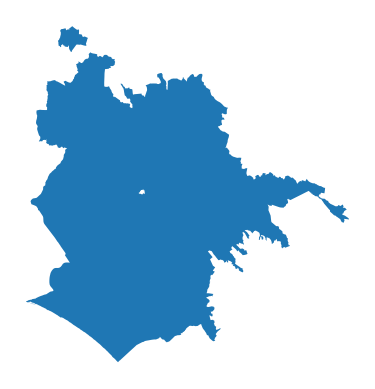

In [5]:
city = ox.geocode_to_gdf('Rome, Italy')
ax = ox.project_gdf(city).plot()
_ = ax.axis('off')

You can just as easily get other place types, such as neighborhoods, boroughs, counties, states, or nations – any place geometry in OpenStreetMap:

In [6]:
place1 = ox.geocode_to_gdf('Pisa, Italy')
place2 = ox.geocode_to_gdf('Italy')
place3 = ox.geocode_to_gdf('Manhattan, New York City, New York, USA')
place4 = ox.geocode_to_gdf('Tuscany, Italy')

<AxesSubplot:>

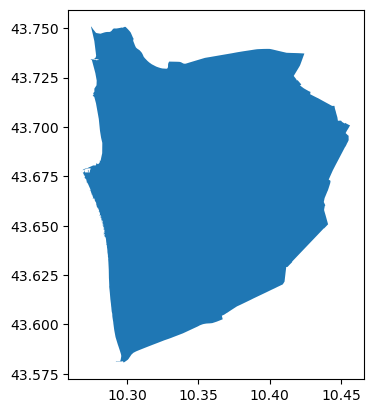

In [7]:
place1.plot()

<AxesSubplot:>

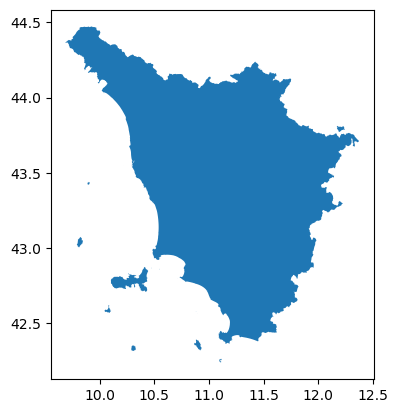

In [8]:
place4.plot()

Or you can pass multiple places into a single query to save a single shapefile or geopackage from their geometries. You can do this with cities, states, countries or any other geographic entities:

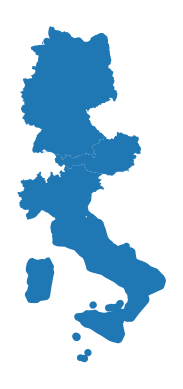

In [9]:
places = ox.geocode_to_gdf(['Italy', 'Austria', 'Germany'])
places = ox.project_gdf(places)
ax = places.plot()
_ = ax.axis('off')

<a id="downloadnetworks"></a>
## Download and model street networks

OSMnx lets you download street network data and build topologically-corrected street networks, project and plot the networks. The street networks are directed and preserve one-way directionality. You can download a street network by providing OSMnx any of the following:

- a bounding box
- a lat-long point plus a distance
- an address plus a distance
- a polygon of the desired street network’s boundaries
- a place name or list of place names

You can also specify several different network types:

- `drive` – get drivable public streets (but not service roads)
- `drive_service` – get drivable public streets, including service roads
- `walk` – get all streets and paths that pedestrians can use (this network type ignores one-way directionality)
- `bike` – get all streets and paths that cyclists can use
- `all` – download all (non-private) OSM streets and paths
- `all_private` – download all OSM streets and paths, including private-access ones

### From bounding box

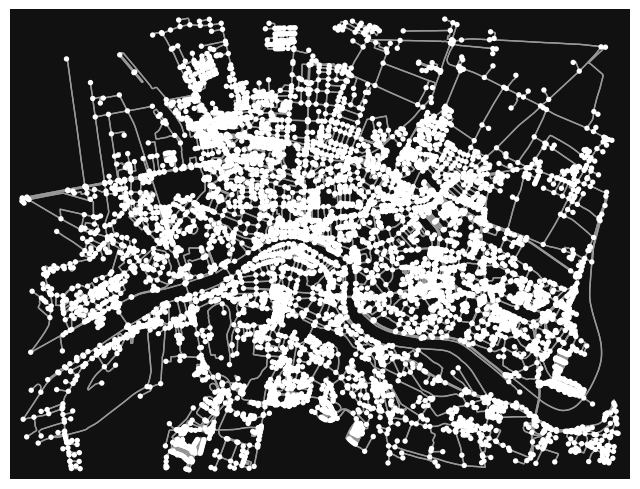

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [10]:
G = ox.graph_from_bbox(43.7400, 43.6918, 10.3601, 10.4477, network_type='walk') #'drive')
G_projected = ox.project_graph(G)
ox.plot_graph(G_projected)

To access geometries easily, we can convert the graph into a `GeoDataFrame`

In [11]:
# you can convert your graph to node and edge GeoPandas GeoDataFrames
gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)

In [12]:
gdf_nodes.head()

,y,x,highway,street_count,geometry
osmid,,,,,
31680788,43.709550,10.427598,crossing,4,POINT (10.42760 43.70955)
31770712,43.710019,10.410429,traffic_signals,3,POINT (10.41043 43.71002)
31770719,43.711265,10.407815,NaN,3,POINT (10.40782 43.71127)
31770722,43.713067,10.407784,NaN,3,POINT (10.40778 43.71307)
31770728,43.715400,10.402142,NaN,3,POINT (10.40214 43.71540)


<AxesSubplot:>

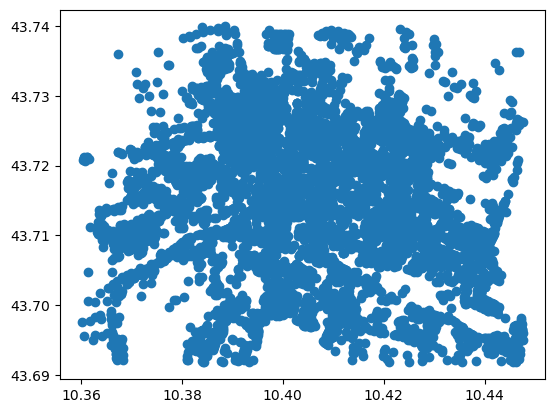

In [13]:
gdf_nodes.plot()

In [14]:
gdf_edges.head()

osmid    highway  oneway reversed  length lanes  \
u        v          key                                                        
31680788 3642089583 0    359508133    footway   False    False   9.457   NaN   
         5109569311 0    359508133    footway   False     True   6.708   NaN   
         7248019354 0     20835131  secondary   False    False  93.291     2   
         1461597786 0     20835131  secondary   False     True  16.244     2   
31770712 774990261  0    303806090  secondary   False     True  28.602   NaN   

                                          name maxspeed  \
u        v          key                                   
31680788 3642089583 0                      NaN      NaN   
         5109569311 0                      NaN      NaN   
         7248019354 0            Via Cisanello       50   
         1461597786 0            Via Cisanello       50   
31770712 774990261  0    Via Giacomo Matteotti      NaN   

                                                                  geometry  \
u        v          key                                                      
31680788 3642089583 0    LINESTRING (10.42760 43.70955, 10.42755 43.70947)   
         5109569311 0    LINESTRING (10.42760 43.70955, 10.42763 43.70960)   
         7248019354 0    LINESTRING (10.42760 43.70955, 10.42707 43.709...   
         1461597786 0    LINESTRING (10.42760 43.70955, 10.42762 43.709...   
31770712 774990261  0    LINESTRING (10.41043 43.71002, 10.41050 43.709...   

                        junction tunnel bridge width service access  ref area  
u        v          key                                                        
31680788 3642089583 0        NaN    NaN    NaN   NaN     NaN    NaN  NaN  NaN  
         5109569311 0        NaN    NaN    NaN   NaN     NaN    NaN  NaN  NaN  
         7248019354 0        NaN    NaN    NaN   NaN     NaN    NaN  NaN  NaN  
         1461597786 0        NaN    NaN    NaN   NaN     NaN    NaN  NaN  NaN  
31770712 774990261  0        NaN    NaN    NaN   NaN     NaN    NaN  NaN  NaN

<AxesSubplot:>

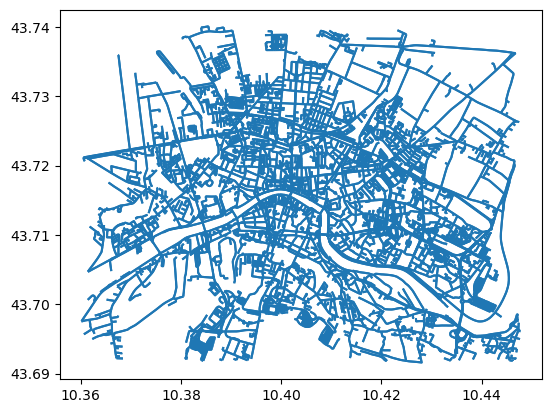

In [15]:
gdf_edges.plot()

You can create a graph from node/edge `GeoDataFrame`s, as long as `gdf_nodes` is indexed by osmid and `gdf_edges` is multi-indexed by $u$, $v$, $key$ (following normal `MultiDiGraph` structure). This allows you to load graph node/edge shapefiles or GeoPackage layers as `GeoDataFrame`s then convert to a `MultiDiGraph` for graph analytics.

In [16]:
# convert node/edge GeoPandas GeoDataFrames to a NetworkX MultiDiGraph
G2 = ox.graph_from_gdfs(gdf_nodes, gdf_edges, graph_attrs=G.graph)
G2

### From lat-long points

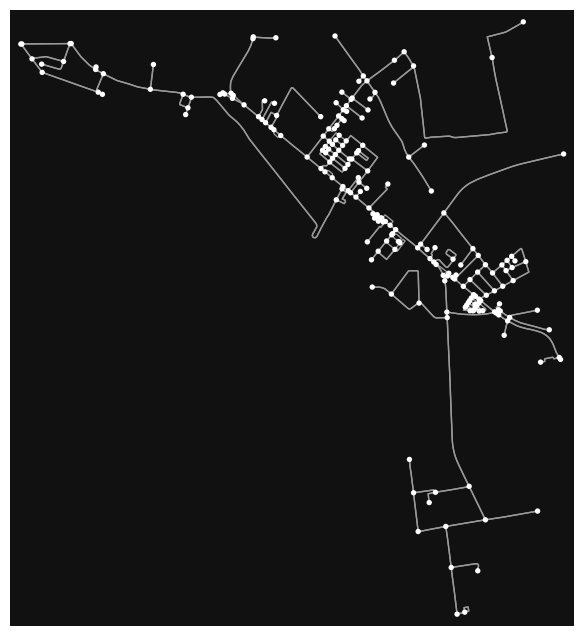

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [17]:
G = ox.graph_from_point((43.7400, 10.3601), dist=1750, network_type='all')
ox.plot_graph(G)

### From address:

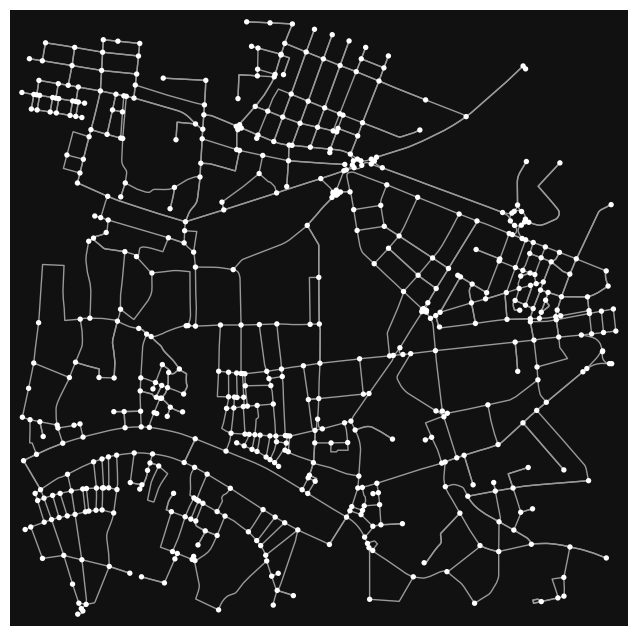

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [18]:
G = ox.graph_from_address('Largo Bruno Pontecorvo 1, Pisa, Italy', network_type='drive')
ox.plot_graph(G)

### From Polygon

In [19]:
place1

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((10.26846 43.67734, 10.26849 43.67724...",43.750935,43.580723,10.456283,10.268455,297813913,relation,42527,43.715939,10.401862,"Pisa, Tuscany, Italy",boundary,administrative,0.84612


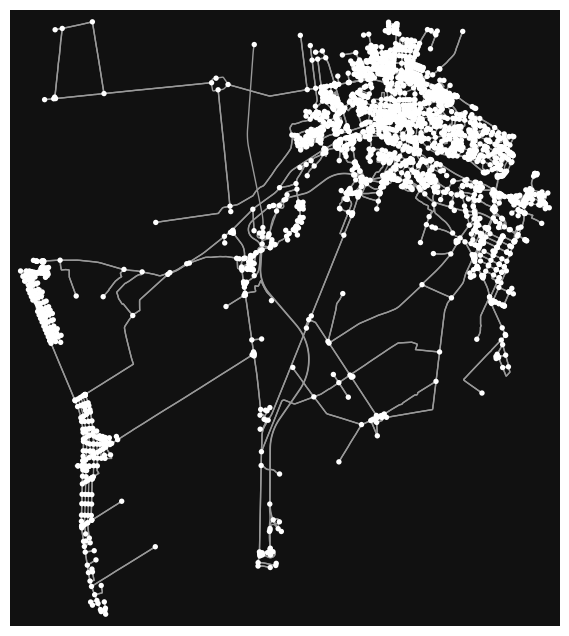

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [20]:
G = ox.graph_from_polygon(place1['geometry'].iloc[0], network_type='drive')
ox.plot_graph(G)

### From place name

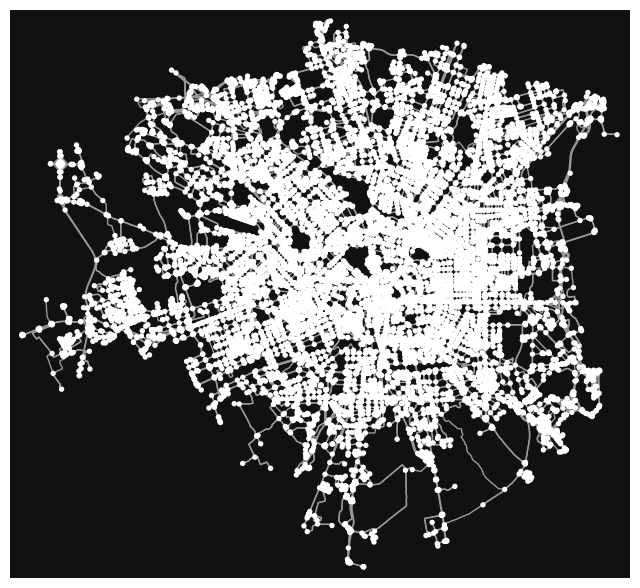

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [21]:
G = ox.graph_from_place('Milan, Italy', network_type='drive')
ox.plot_graph(G)

You can just as easily request a street network within a borough, county, state, or other geographic entity. You can also pass a list of places (such as several neighboring cities) to create a unified street network within them. This list of places can include strings and/or structured key:value place queries:

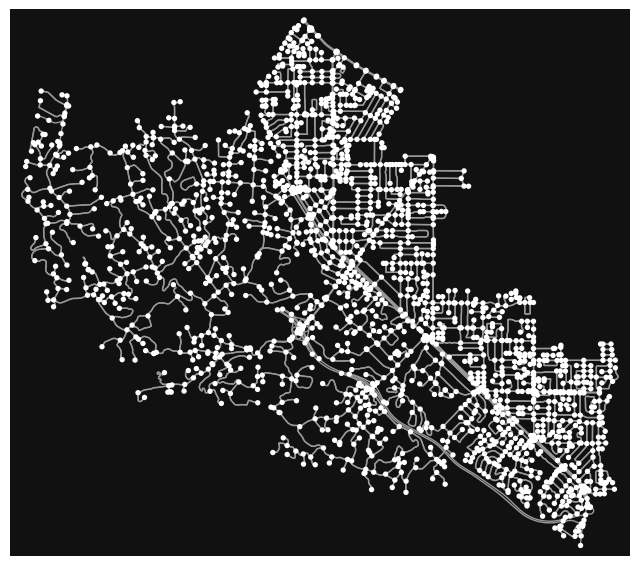

(<Figure size 800x800 with 1 Axes>, <AxesSubplot:>)

In [22]:
places = ['Los Altos, California, USA',
          {'city':'Los Altos Hills', 'state':'California'},
          'Loyola, California']
G = ox.graph_from_place(places, network_type='drive')
ox.plot_graph(G)

<a id="analyzenetworks"></a>
## Analyze street networks

In [23]:
# what sized area does our network cover in square meters?
G = ox.graph_from_place("Piedmont, California, USA", network_type="drive")
G_proj = ox.project_graph(G)
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

4215057.94493957

In [24]:
# show some basic stats about the network
ox.basic_stats(G_proj, area=graph_area_m, clean_int_tol=15)

{'n': 348,
 'm': 940,
 'k_avg': 5.402298850574713,
 'edge_length_total': 113088.97000000006,
 'edge_length_avg': 120.30741489361708,
 'streets_per_node_avg': 2.9597701149425286,
 'streets_per_node_counts': {0: 0, 1: 34, 2: 0, 3: 264, 4: 47, 5: 2, 6: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.09770114942528736,
  2: 0.0,
  3: 0.7586206896551724,
  4: 0.13505747126436782,
  5: 0.005747126436781609,
  6: 0.0028735632183908046},
 'intersection_count': 314,
 'street_length_total': 58500.43000000004,
 'street_segment_count': 492,
 'street_length_avg': 118.90331300813016,
 'circuity_avg': 1.1124625803529844,
 'self_loop_proportion': 0.006097560975609756,
 'clean_intersection_count': 266,
 'node_density_km': 82.56114258590321,
 'intersection_density_km': 74.49482405739542,
 'edge_density_km': 26829.754531790044,
 'street_density_km': 13878.914777490381,
 'clean_intersection_density_km': 63.10708025244326}

### Visualize street centrality
Here we plot the street network and color its edges (streets) by their relative closeness centrality.

In [25]:
# !pip install networkx
import networkx as nx

In [26]:
# convert graph to line graph so edges become nodes and vice versa
edge_centrality = nx.closeness_centrality(nx.line_graph(G))
nx.set_edge_attributes(G, edge_centrality, "edge_centrality")

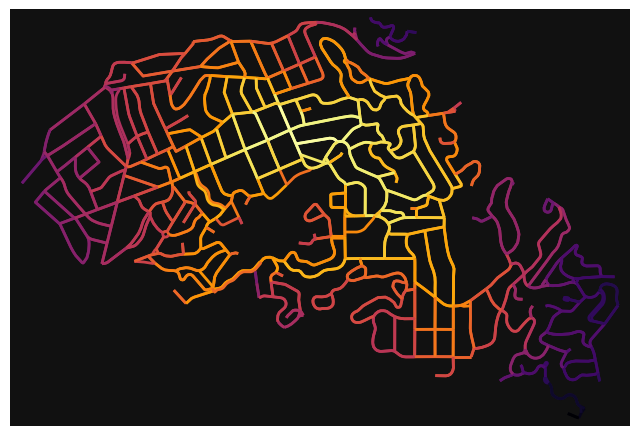

In [27]:
# color edges in original graph with closeness centralities from line graph
ec = ox.plot.get_edge_colors_by_attr(G, "edge_centrality", cmap="inferno")
fig, ax = ox.plot_graph(G, edge_color=ec, edge_linewidth=2, node_size=0)

### Routing

In [2]:
# impute missing edge speeds and calculate edge travel times with the speed module
G = ox.speed.add_edge_speeds(G)
G = ox.speed.add_edge_travel_times(G)

In [29]:
# get the nearest network nodes to two lat/lng points with the distance module
orig = ox.distance.nearest_nodes(G, X=-122.245846, Y=37.828903)
dest = ox.distance.nearest_nodes(G, X=-122.215006, Y=37.812303)

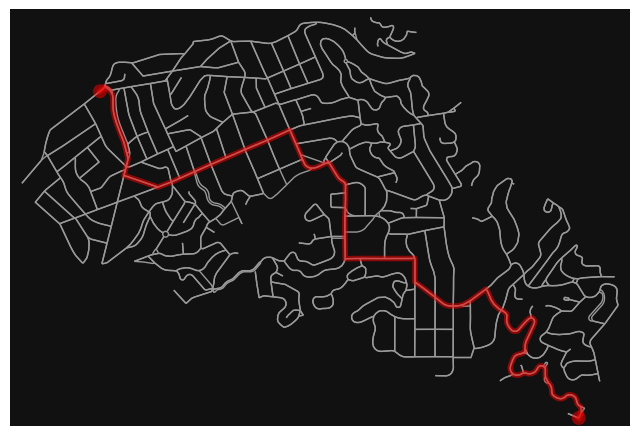

In [30]:
# find the shortest path between nodes, minimizing travel time, then plot it
route = ox.shortest_path(G, orig, dest, weight="travel_time")
fig, ax = ox.plot_graph_route(G, route, node_size=0)

In [31]:
# how long is our route in meters?
edge_lengths = ox.utils_graph.get_route_edge_attributes(G, route, "length")
round(sum(edge_lengths))

4759

In [32]:
# how far is it between these two nodes as the crow flies?
# use OSMnx's vectorized great-circle distance (haversine) function
orig_x = G.nodes[orig]["x"]
orig_y = G.nodes[orig]["y"]
dest_x = G.nodes[dest]["x"]
dest_y = G.nodes[dest]["y"]
round(ox.distance.great_circle_vec(orig_y, orig_x, dest_y, dest_x))

3124

<a id="pois"></a>
# Points of Interest and Geospatial Entities
The `geometries` module of OSMnx allows downloading entities, such as grocery stores, transit stops, points of interest (POIs), or building footprints, and turn them into a `GeoDataFrame`.

To query, pass a tags dict where keys are OSM tags. The dict's values can be either:

- True to retrieve all OSM objects with this tag, regardless of its value
- a single value as a string to retrieve all OSM objects with this tag:value combination
- a list of string values to retrieve all OSM objects where this tag matches any of these values

Pass multiple dict key:value pairs to retrieve the union (not intersection) of these pairs.

See [docs](https://wiki.openstreetmap.org/wiki/Map_features).

In [33]:
# get all building footprints in some neighborhood
# `True` means retrieve any object with this tag, regardless of value
place = "Aeroporto Galileo Galilei, Pisa, Italy"
#place = 'Bunker Hill, Los Angeles, California'
tags = {"building": True}
gdf = ox.geometries_from_place(place, tags)
gdf.shape

(2, 12)

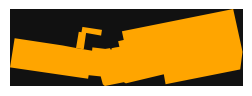

In [34]:
fig, ax = ox.plot_footprints(gdf, figsize=(3, 3))

In [35]:
# get all the parks in some neighborhood
# constrain acceptable `leisure` tag values to `park`
place = "Pisa, Italy"
tags = {"leisure": "park"}
gdf = ox.geometries_from_place(place, tags)
gdf.shape

(152, 30)

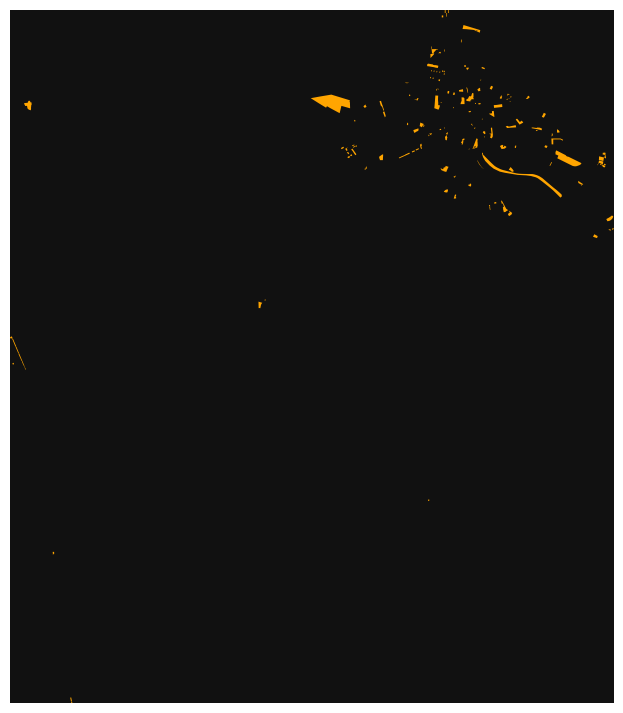

In [36]:
fig, ax = ox.plot_footprints(gdf, figsize=(9, 9))

In [37]:
# get all the parks in some neighborhood
# constrain acceptable `leisure` tag values to `park`
place = "Rome, Italy"
tags = {"leisure": "park"}
gdf = ox.geometries_from_place(place, tags)
gdf.shape

(1061, 90)

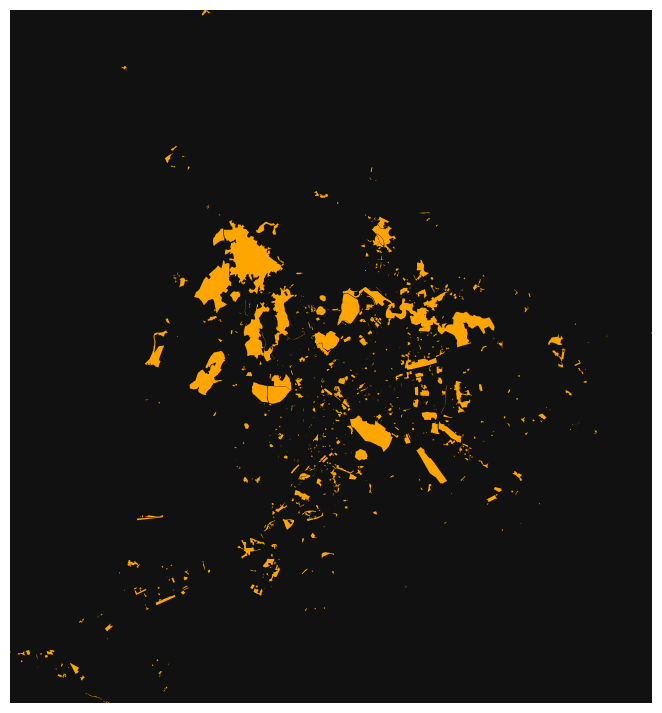

In [38]:
fig, ax = ox.plot_footprints(gdf, figsize=(9, 9))

In [40]:
import folium
centroid = gdf.centroid.iloc[0]
map_f = folium.Map(location=[centroid.y, centroid.x])
geo_j = gdf.to_json()
geo_j = folium.GeoJson(data=geo_j,
                       style_function=lambda x: {'fillColor': 'red', 'weight': 1})
geo_j.add_to(map_f)
map_f

C:\Users\Pavilion\AppData\Local\Temp\ipykernel_15892\1700482921.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid.iloc[0]


In [41]:
# get everything tagged amenity,
# and everything tagged landuse = retail or commercial,
# and everything tagged highway = bus_stop
tags = {"amenity": True, "landuse": ["retail", "commercial"], "highway": "bus_stop"}
gdf = ox.geometries_from_place("Piedmont, California, USA", tags)
gdf.shape

(139, 61)

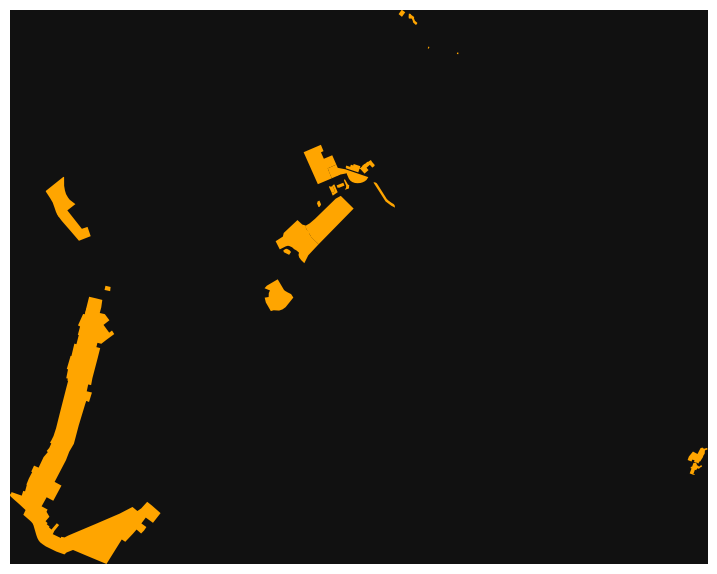

In [42]:
fig, ax = ox.plot_footprints(gdf, figsize=(9, 9))

In [43]:
centroid = gdf.centroid.iloc[0]
map_f = folium.Map(location=[centroid.y, centroid.x])
geo_j = gdf.to_json()
geo_j = folium.GeoJson(data=geo_j,
                       style_function=lambda x: {'fillColor': 'red', 'weight': 1})
geo_j.add_to(map_f)
map_f

C:\Users\Pavilion\AppData\Local\Temp\ipykernel_15892\1945419958.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid.iloc[0]


## Practice: Let's take all restaurants in Lucca

In [44]:
# get all the parks in some neighborhood
# constrain acceptable `leisure` tag values to `park`
tags = {"building": 'supermarket'}
gdf = ox.geometries_from_place('Lucca, Italy', tags)
gdf.shape

(3, 10)

In [45]:
gdf.head()

nodes  \
element_type osmid                                                          
way          159244265  [1713360321, 1713360197, 1713360124, 364563816...   
             369134743  [3729500013, 3729506434, 3729500023, 372950642...   
             397606141  [4003913446, 4003913440, 4003913442, 400391344...   

                           building  check_date                    name  \
element_type osmid                                                        
way          159244265  supermarket  2022-09-03  Esselunga dell'Arancio   
             369134743  supermarket         NaN                     NaN   
             397606141  supermarket         NaN                    Coop   

                       payment:mastercard payment:visa         shop  \
element_type osmid                                                    
way          159244265                yes          yes  supermarket   
             369134743                NaN          NaN          NaN   
             397606141                NaN          NaN  supermarket   

                       toilets:wheelchair wheelchair  \
element_type osmid                                     
way          159244265                yes        yes   
             369134743                NaN        NaN   
             397606141                NaN        NaN   

                                                                 geometry  
element_type osmid                                                         
way          159244265  POLYGON ((10.52615 43.84889, 10.52613 43.84871...  
             369134743  POLYGON ((10.49934 43.84902, 10.49949 43.84859...  
             397606141  POLYGON ((10.52957 43.84147, 10.52947 43.84088...

<AxesSubplot:>

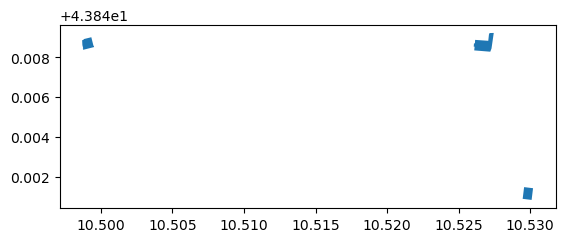

In [46]:
gdf.plot()

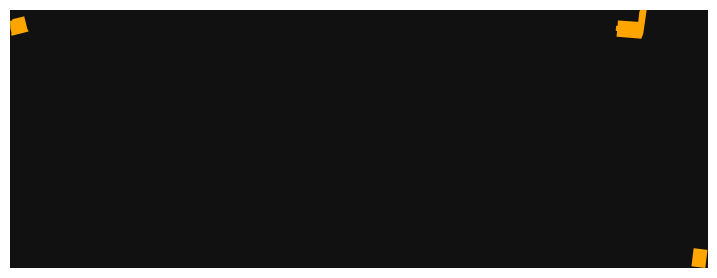

In [47]:
fig, ax = ox.plot_footprints(gdf, figsize=(9, 9))

In [48]:
centroid = gdf.centroid.iloc[0]
map_f = folium.Map(location=[centroid.y, centroid.x], zoom_start=14)
geo_j = gdf.to_json()
geo_j = folium.GeoJson(data=geo_j,
                       style_function=lambda x: {'fillColor': 'blue', 'weight': 1})
geo_j.add_to(map_f)
map_f

C:\Users\Pavilion\AppData\Local\Temp\ipykernel_15892\2416187028.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid.iloc[0]


All stadiums in London

In [49]:
# get all the parks in some neighborhood
# constrain acceptable `leisure` tag values to `park`
tags = {"building": 'stadium'}
gdf = ox.geometries_from_place('London, UK', tags)
gdf.shape

(70, 44)

In [50]:
gdf

geometry  \
element_type osmid                                                         
way          4253703   POLYGON ((-0.34343 51.45082, -0.34320 51.45093...   
             4270350   POLYGON ((-0.03821 51.63075, -0.03810 51.63099...   
             4629309   POLYGON ((-0.08460 51.46158, -0.08407 51.46182...   
             18926807  POLYGON ((-0.17118 51.39340, -0.17129 51.39332...   
             57869057  POLYGON ((-0.01141 51.54062, -0.01143 51.54060...   
...                                                                  ...   
relation     1949061   POLYGON ((-0.34317 51.45675, -0.34211 51.45723...   
             2548271   POLYGON ((-0.21497 51.43277, -0.21498 51.43281...   
             4087734   POLYGON ((-0.19076 51.48097, -0.19061 51.48084...   
             7708006   POLYGON ((-0.06742 51.60492, -0.06728 51.60502...   
             10266378  POLYGON ((-0.01751 51.53979, -0.01734 51.53986...   

                                                                 note  \
element_type osmid                                                      
way          4253703                                              NaN   
             4270350                                              NaN   
             4629309                                              NaN   
             18926807  name amended to correspond to its own web site   
             57869057                                             NaN   
...                                                               ...   
relation     1949061                                              NaN   
             2548271                                              NaN   
             4087734                                              NaN   
             7708006                                              NaN   
             10266378                                             NaN   

                                                name wheelchair description  \
element_type osmid                                                            
way          4253703                       DHL Stand        NaN         NaN   
             4270350                             NaN        NaN         NaN   
             4629309                             NaN        NaN         NaN   
             18926807  Tooting and Mitcham United FC        NaN         NaN   
             57869057         London Aquatics Centre        yes         NaN   
...                                              ...        ...         ...   
relation     1949061                             NaN        NaN         NaN   
             2548271                             NaN        NaN         NaN   
             4087734                             NaN        NaN         NaN   
             7708006       Tottenham Hotspur Stadium        NaN         NaN   
             10266378                            NaN        NaN         NaN   

                      layer  \
element_type osmid            
way          4253703    NaN   
             4270350    NaN   
             4629309    NaN   
             18926807   NaN   
             57869057     2   
...                     ...   
relation     1949061    NaN   
             2548271    NaN   
             4087734    NaN   
             7708006    NaN   
             10266378   NaN   

                                                                   nodes  \
element_type osmid                                                         
way          4253703   [25473012, 3326373714, 25473013, 8897543150, 5...   
             4270350   [25637054, 8772069299, 8770493875, 8772069300,...   
             4629309   [939600798, 939600574, 939601531, 29400411, 62...   
             18926807  [195855393, 195855396, 195855400, 195855402, 1...   
             57869057  [717876172, 1836464937, 1409894767, 1836464916...   
...                                                                  ...   
relation     1949061   [[[25472652, 25472653, 25472655, 1574389714, 2...   
         

<AxesSubplot:>

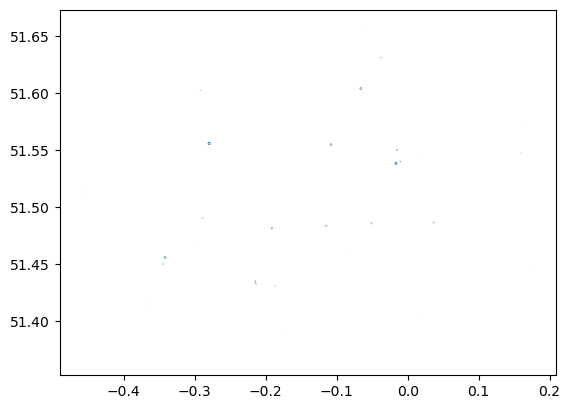

In [51]:
gdf.plot()

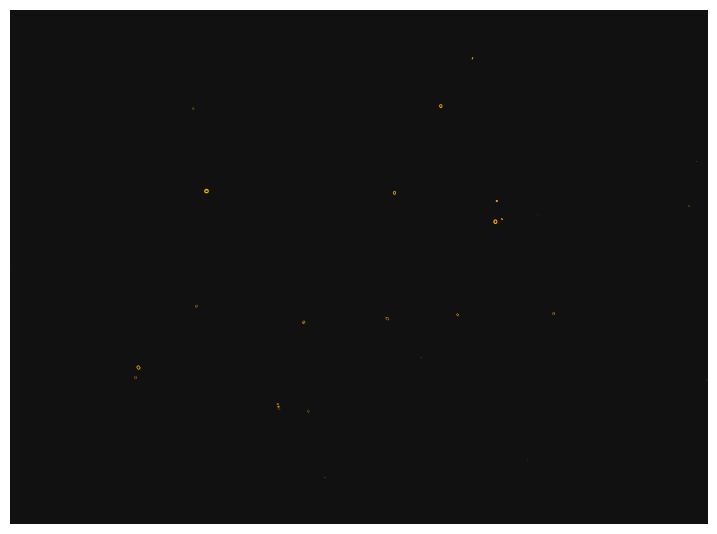

In [52]:
fig, ax = ox.plot_footprints(gdf, figsize=(9, 9))

In [53]:
centroid = gdf.centroid.iloc[0]
map_f = folium.Map(location=[centroid.y, centroid.x], zoom_start=14)
geo_j = gdf.to_json()
geo_j = folium.GeoJson(data=geo_j,
                       style_function=lambda x: {'fillColor': 'blue', 'weight': 1})
geo_j.add_to(map_f)
map_f

C:\Users\Pavilion\AppData\Local\Temp\ipykernel_15892\2416187028.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.centroid.iloc[0]
